# Exploratory Data Analysis

In this notebook, we study the filters of the CNNs learnt during the CDA to see if we can learn anything useful. We take the following approach to visualising filters: We sample a set of images for each class (of a binary variable) and pass them through the model. We then take the average over all outputs (obtained from each input image) and study the difference between the two classes. The reason for this experiment is as follows:

1. CNNs are said to learn patterns that are *translation invariant* and they learn *spatial hierarchies* of patterns. If we can assume that the  layers highlights such translation invariant patterns, we can study the difference between the patterns produced with samples of different classes. We hope to see patterns produced for each sample (of the same class) that are near equal in centre, scale, rotation, etc..
2. Additionally, since spatial hierarchies are learnt, then the deeper layers are said to learn more *abstract* patterns, so we should expect that the shallower layers would learn more *representational* or *full* patterns. Thus studying the outputs of the first or middle layer may be most useful.

Then by taking the average output over a set of images for each class, we can study the difference in patterns between the two classes. In doing so, we can use these differences to hypothesize the effects of pneumonia and covid on the chest area.

Note, whilst we have plotted the graphs inline, they are quite unsatisfactory. Therefore we advice changing the plots to be window-based allowing full-screening and zooming in. To do this, in the import section below, change '**%matplotlib notebook'** to '**%matplotlib tk'**', and you will probably need to restart the kernel aswell.

## Preliminaries (imports and function definitions)

In [22]:
import matplotlib.pyplot as plt
import numpy as np
from keras import models
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:75% !important; }</style>"))
%matplotlib notebook

In [8]:
def create_visualisations(model, class_one_img_generator, class_two_img_generator, activation_model, num_layers,
                          class_names,
                          num_cols=16, num_samples=50, digitize=False, num_bins=7, main_cmap='viridis',
                          diff_cmap='seismic'):
    layer_names = [layer.name for layer in model.layers[:num_layers]]

    activations_one = activation_model.predict(class_one_img_generator.next()[0])
    activations_two = activation_model.predict(class_two_img_generator.next()[0])

    for _ in range(1,num_samples):
        temp_class1_acts = activation_model.predict(class_one_img_generator.next()[0])
        temo_class2_acts = activation_model.predict(class_two_img_generator.next()[0])

        for l in range(num_layers):
            activations_one[l] += temp_class1_acts[l]
            activations_two[l] += temo_class2_acts[l]

    for l in range(num_layers):
        activations_one[l] /= (num_samples + 1)
        activations_two[l] /= (num_samples + 1)

    for i in range(num_layers):

        layer_name, class1_activation_layer, class2_activation_layer = layer_names[i], activations_one[i], \
                                                                       activations_two[i]
        
        if 'conv' not in layer_name:
            continue # ignores max-pool layers 

        num_filters = class1_activation_layer.shape[-1]
        size = class1_activation_layer.shape[1]

        num_rows = num_filters // num_cols  # integer division
        display_grid_one = np.zeros((num_rows * size, num_cols * size))
        display_grid_two = display_grid_one.copy()

        for row in range(num_rows):
            for col in range(num_cols):
                # update display grid image with filter
                filt_idx = (row * num_cols) + col
                if num_layers >= 2:
                    class1_img = class1_activation_layer[0, ..., filt_idx]
                    class2_img = class2_activation_layer[0, ..., filt_idx]
                else:
                    class1_img = class1_activation_layer[..., filt_idx]
                    class2_img = class2_activation_layer[..., filt_idx]

                class1_img = post_process_image(class1_img)
                class2_img = post_process_image(class2_img)

                display_grid_one[row * size: (row + 1) * size, col * size: (col + 1) * size] = class1_img
                display_grid_two[row * size: (row + 1) * size, col * size: (col + 1) * size] = class2_img

        if digitize:
            bins = np.linspace(0, 255, num_bins, endpoint=True)
            # bins = np.linspace(np.min(np.r_[norm_display_grid, pneu_display_grid]),
            #                    np.max(np.r_[norm_display_grid, pneu_display_grid]), num_bins)
            norm_idxs = np.digitize(display_grid_one,
                                    bins=bins, right=True)
            pneu_idxs = np.digitize(display_grid_two,
                                    bins=bins, right=True)

            display_grid_one = bins[norm_idxs].reshape(num_rows * size, num_cols * size)
            display_grid_two = bins[pneu_idxs].reshape(num_rows * size, num_cols * size)
    
        fig, axs = plt.subplots(ncols=1, nrows=4)

        axs[0].set_title(layer_name + ' : ' + class_names[0])
        axs[0].imshow(display_grid_one, aspect='auto', cmap=main_cmap)

        axs[1].set_title(layer_name + ' : ' + class_names[1])
        axs[1].imshow(display_grid_two, aspect='auto', cmap=main_cmap)

        avg_diff = display_grid_two - display_grid_one
        axs[2].set_title(layer_name + ' : diff = ' + class_names[0] + ' - ' + class_names[1])
        axs[2].imshow(avg_diff, aspect='auto', cmap=diff_cmap)

        avg_diff_alp = (avg_diff / np.max(np.abs(avg_diff))) * 4
        avg_diff = np.clip(avg_diff, 0, 255).astype(int)

        axs[3].set_title(layer_name + ' : diff added to ' + class_names[0])
        axs[3].imshow(display_grid_one, aspect='auto', alpha=1 - avg_diff_alp, cmap=main_cmap)
        axs[3].imshow(avg_diff, aspect='auto', alpha=avg_diff_alp, cmap='inferno')

        [axs[i].axis('off') for i in range(len(axs))]
        [axs[i].grid(False) for i in range(len(axs))]


def post_process_image(chan_img):
    # chan_img /= np.max(chan_img)
    # chan_img *= 255
    # remember: standardize image to have image position at centre of colormap, with std = 64 = (256/4)
    #  Hence, 128 +- (2 std) = 256 (from Deep Learning with Python book)
    chan_img -= chan_img.mean()
    chan_img = (chan_img / chan_img.std()) * 64 + 128
    return np.clip(chan_img, 0, 255).astype(int)

## Visualizing the normal/pneumonia model 

We now study the first two convolution layers of the CNN for the normal/pneumonia classifier. However, before doing so, let us plot the average image produced between the two classes:

In [10]:
norm_pneu_model = load_model('pneumonia_model_data/normal_and_pneumonia_small_1.h5')

class_one_img_generator = ImageDataGenerator(rescale=1. / 255).flow_from_directory(
    'Coronahack-Chest-XRay-Dataset/test/norm_pneu/',
    target_size=(150, 150), batch_size=1, class_mode='binary', color_mode='grayscale', classes=['normal'])

class_two_img_generator = ImageDataGenerator(rescale=1. / 255).flow_from_directory(
    'Coronahack-Chest-XRay-Dataset/test/norm_pneu/',
    target_size=(150, 150), batch_size=1, class_mode='binary', color_mode='grayscale', classes=['pneumonia'])

num_layers = 3

layer_outputs = [layer.output for layer in norm_pneu_model.layers[:num_layers]]
activation_model = models.Model(inputs=norm_pneu_model.input, outputs=layer_outputs)
class_names = ['normal', 'pneumonia']


Found 394 images belonging to 1 classes.
Found 394 images belonging to 1 classes.


<IPython.core.display.Javascript object>


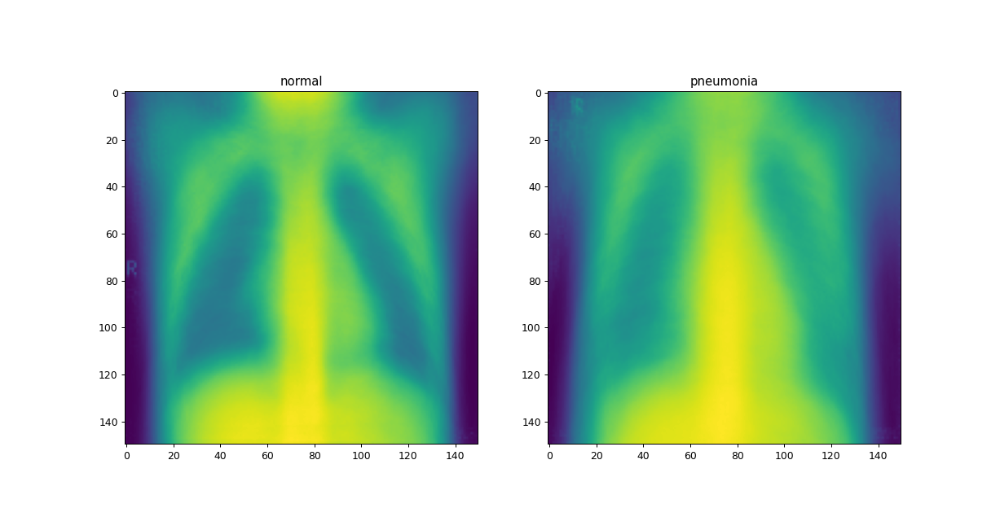

In [29]:
num_samp = 200
img_one = class_one_img_generator.next()[0][0, ..., 0]
img_two = class_two_img_generator.next()[0][0, ..., 0]
for _ in range(1, num_samp):
    img_one += class_one_img_generator.next()[0][0, ..., 0]
    img_two += class_two_img_generator.next()[0][0, ..., 0]

avg_img_one = img_one /num_samp
avg_img_two = img_two /num_samp

fig, axs = plt.subplots(1,2)
axs[0].imshow(avg_img_one)
axs[1].imshow(avg_img_two)

[axs[i].set_title(class_names[i]) for i in range(len(axs))]
plt.show()

Whilst not very clear, if the images are aligned well enough, then there appears to be a different heart shape on average between normal patients and pneumonia. Let us proceed to see what the CNNs outputs with samples from the test dataset.

<IPython.core.display.Javascript object>


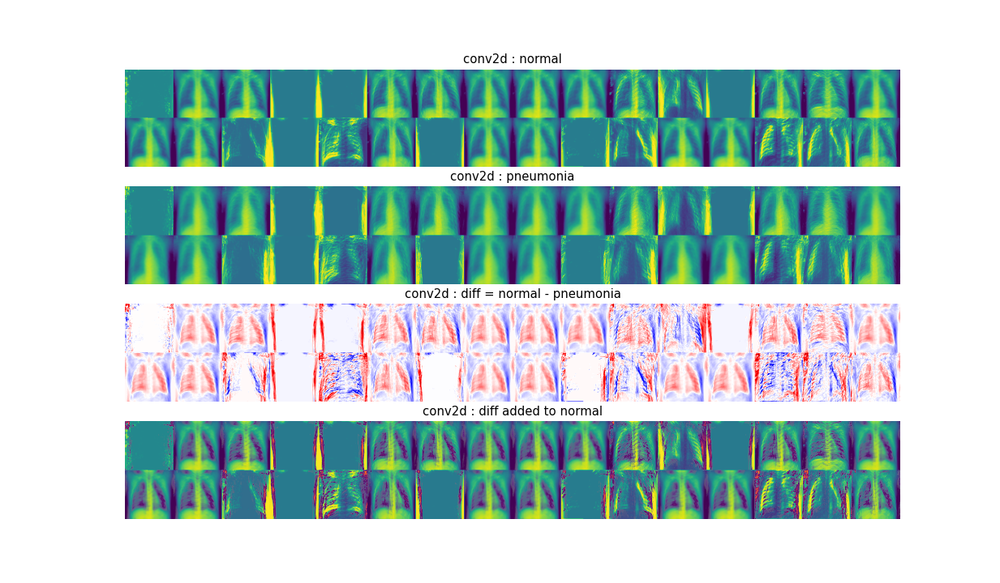

<IPython.core.display.Javascript object>


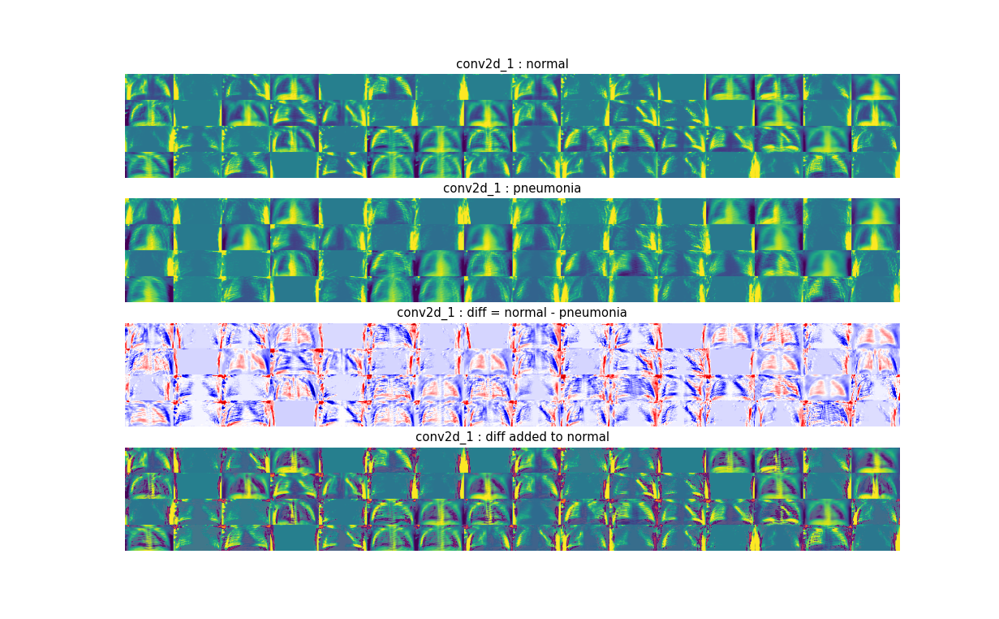

In [24]:
create_visualisations(norm_pneu_model, class_one_img_generator, class_two_img_generator, activation_model,
                      num_layers,
                      class_names=class_names,
                      num_cols=16, num_samples=30, digitize=False, num_bins=7)
plt.show()

The images above do not seem very telling. However, from the first layer it does appear that the shapes of the heart are different, with the average of the normal patients having it more shapely, whilst the pneumonia patients have theirs long-ish. To see this, look for example to the fifth image of the second row of each class, or the 12th image in the first row.

Studying the differences (the set of blue/red images), the red portion coincides with the region where the pneumonia outputs was more pronounced, and the blue where the normal outputs are more pronounced. In this case, the differences do not appear very useful perhaps due to too much variation in color. Let us increase the contrast between the colors of the images, firstly via digitizing the values of the images, secondly via a different colormap:

<IPython.core.display.Javascript object>


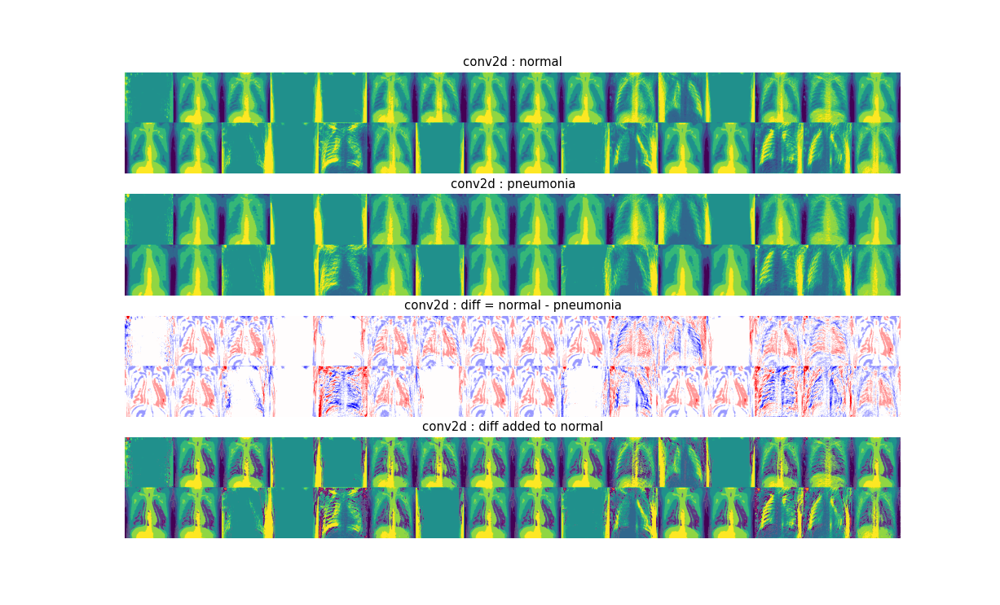

<IPython.core.display.Javascript object>


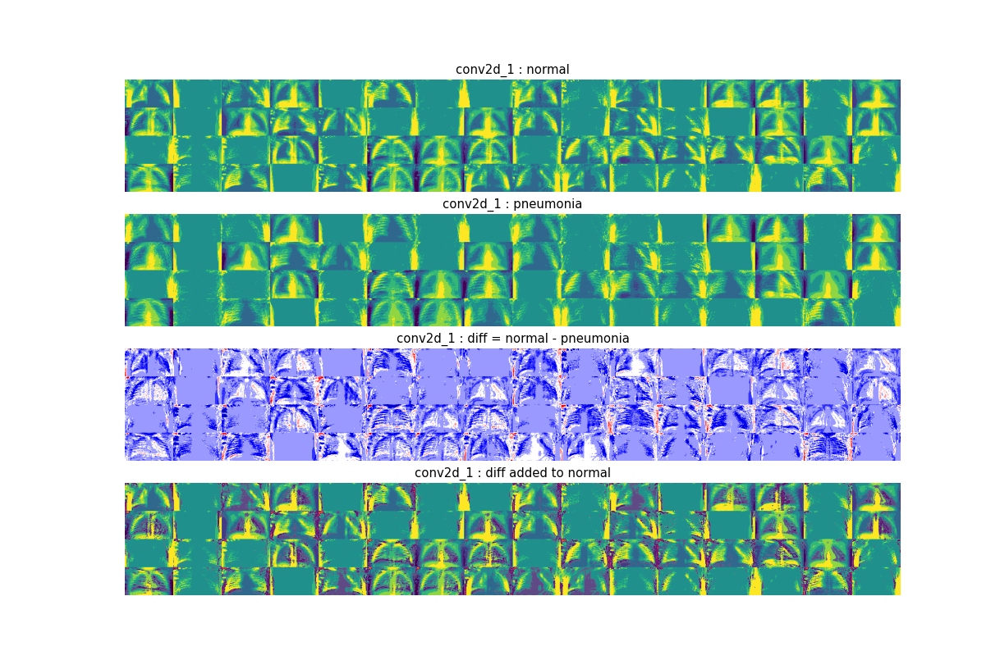

In [26]:
create_visualisations(norm_pneu_model, class_one_img_generator, class_two_img_generator, activation_model,
                      num_layers,
                      class_names=class_names,
                      num_cols=16, num_samples=30, digitize=True, num_bins=7)
plt.show()

The digitization shows the difference in heart shapes, but also now the prominence of the diaphragm of plots for the normal patients. As per the previous plot, there is a better contrast between the lung cavity and the heart with the normal patients than for the pneumonia patients. 

Care has to be taken to ensure that the interpretation taken from the images above is not attributed to any artefacts produced via the digitization procedure. Let us now try a different colormap:

<IPython.core.display.Javascript object>


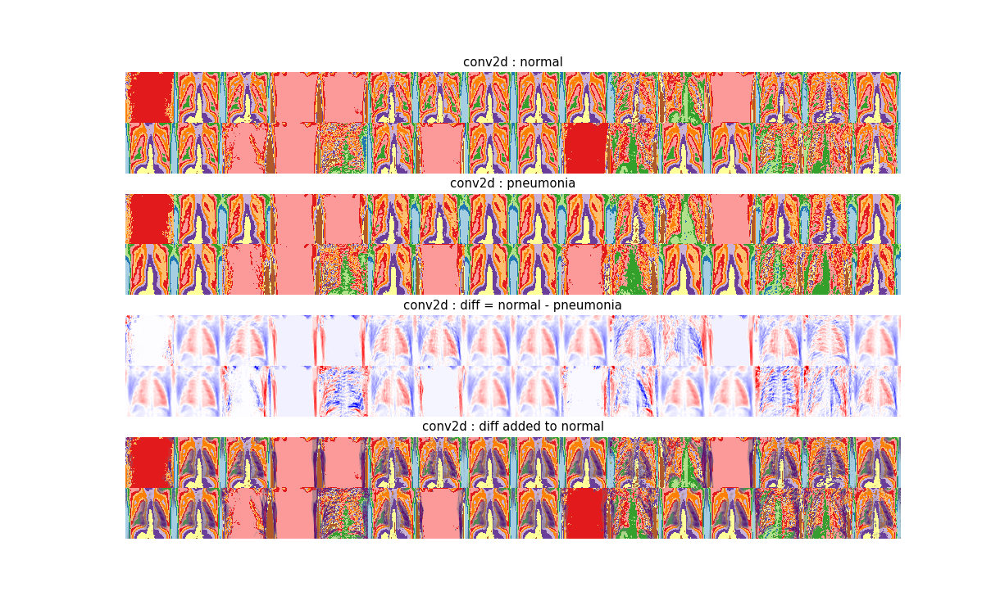

<IPython.core.display.Javascript object>


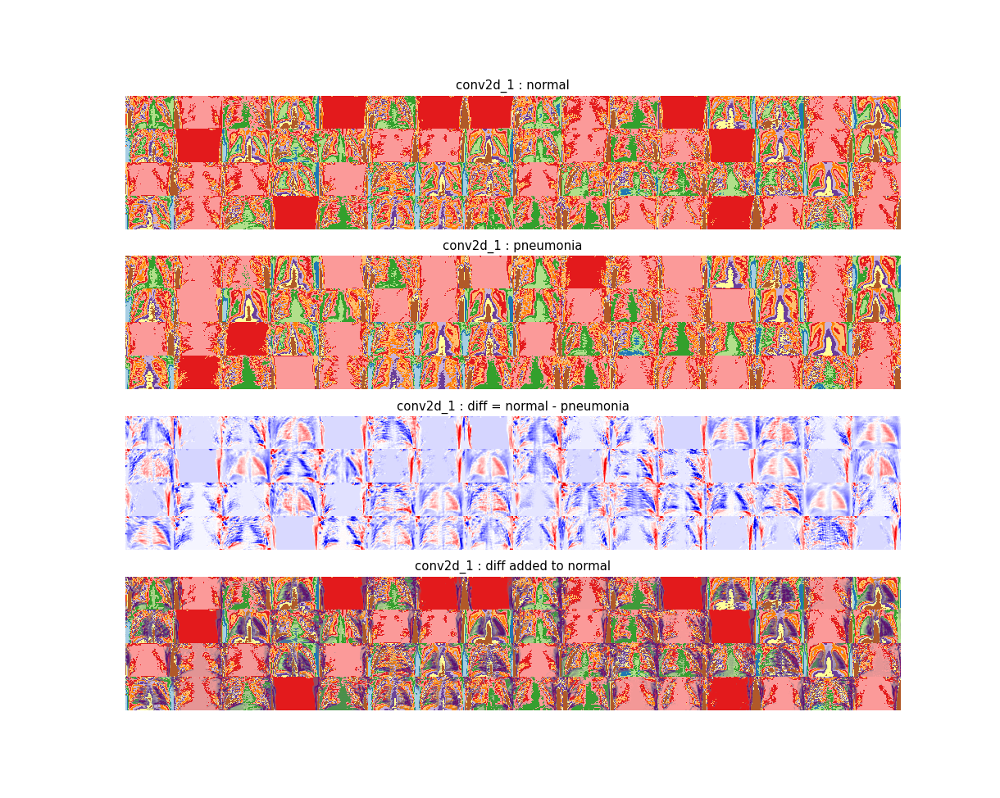

In [27]:
create_visualisations(norm_pneu_model, class_one_img_generator, class_two_img_generator, activation_model,
                      num_layers,
                      class_names=class_names,
                      num_cols=16, num_samples=30, digitize=False, main_cmap='Paired')
plt.show()

Once again, the shapeliness of the heart of normal patients is visible, and those with pneumonia appearing droopy, with higher value intensity on the lower right side. Additionally, the diaphragm of normal patients appear more distinct. Something can perhaps be said about the lungs however.

## Visualizing the virus/bacteria model 

We now move on to study the virus/bacteria classifier. Remember that this model was not as successfuly as the other two, hence we may not be able to find differences easily between the patterns. We will again first plot the average image.

In [40]:
# step: study of virus/bacteria model

virus_bac_model = load_model('virus_model_data/virus_small_1.h5')

class_one_img_generator = ImageDataGenerator(rescale=1. / 255).flow_from_directory(
    'Coronahack-Chest-XRay-Dataset/test/virus_bacteria/',
    target_size=(150, 150), batch_size=1, class_mode='binary', color_mode='grayscale', classes=['virus'])

class_two_img_generator = ImageDataGenerator(rescale=1. / 255).flow_from_directory(
    'Coronahack-Chest-XRay-Dataset/test/virus_bacteria/',
    target_size=(150, 150), batch_size=1, class_mode='binary', color_mode='grayscale', classes=['bacteria'])

num_layers = 3

layer_outputs = [layer.output for layer in virus_bac_model.layers[:num_layers]]
activation_model = models.Model(inputs=virus_bac_model.input, outputs=layer_outputs)
class_names = ['virus', 'bacteria']

Found 354 images belonging to 1 classes.
Found 354 images belonging to 1 classes.


<IPython.core.display.Javascript object>


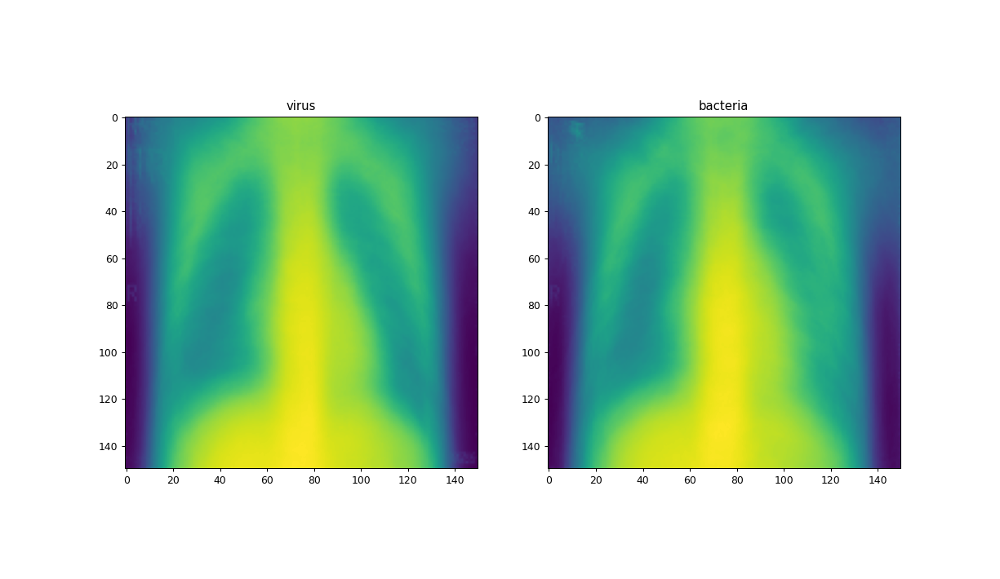

In [41]:
num_samp = 200
img_one = class_one_img_generator.next()[0][0, ..., 0]
img_two = class_two_img_generator.next()[0][0, ..., 0]
for _ in range(1, num_samp):
    img_one += class_one_img_generator.next()[0][0, ..., 0]
    img_two += class_two_img_generator.next()[0][0, ..., 0]

avg_img_one = img_one /num_samp
avg_img_two = img_two /num_samp

fig, axs = plt.subplots(1,2)
axs[0].imshow(avg_img_one)
axs[1].imshow(avg_img_two)

[axs[i].set_title(class_names[i]) for i in range(len(axs))]
plt.show()

There appears to be slight variation in the average heart shape, however perhaps it is not significant enough (as well as any other patterns), hence the lack of good accuracy score.  

<IPython.core.display.Javascript object>


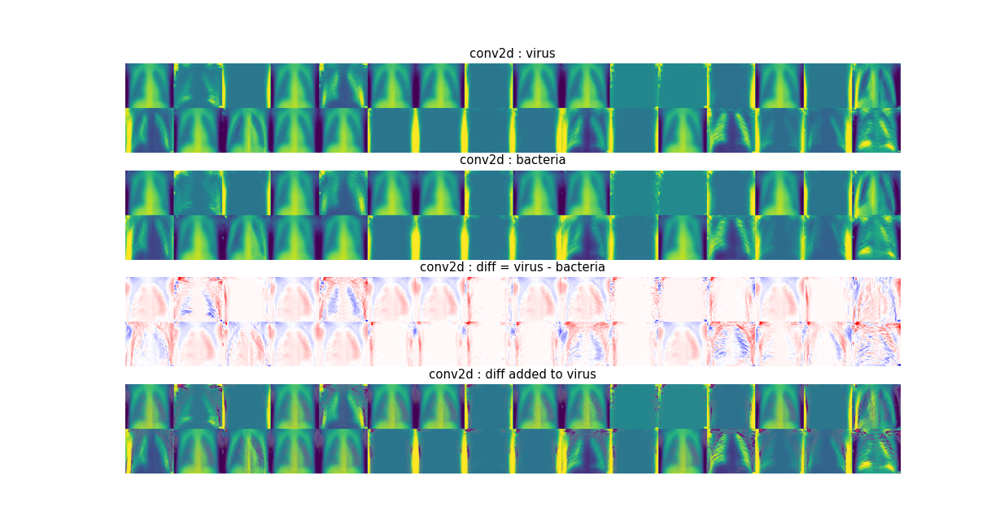

<IPython.core.display.Javascript object>


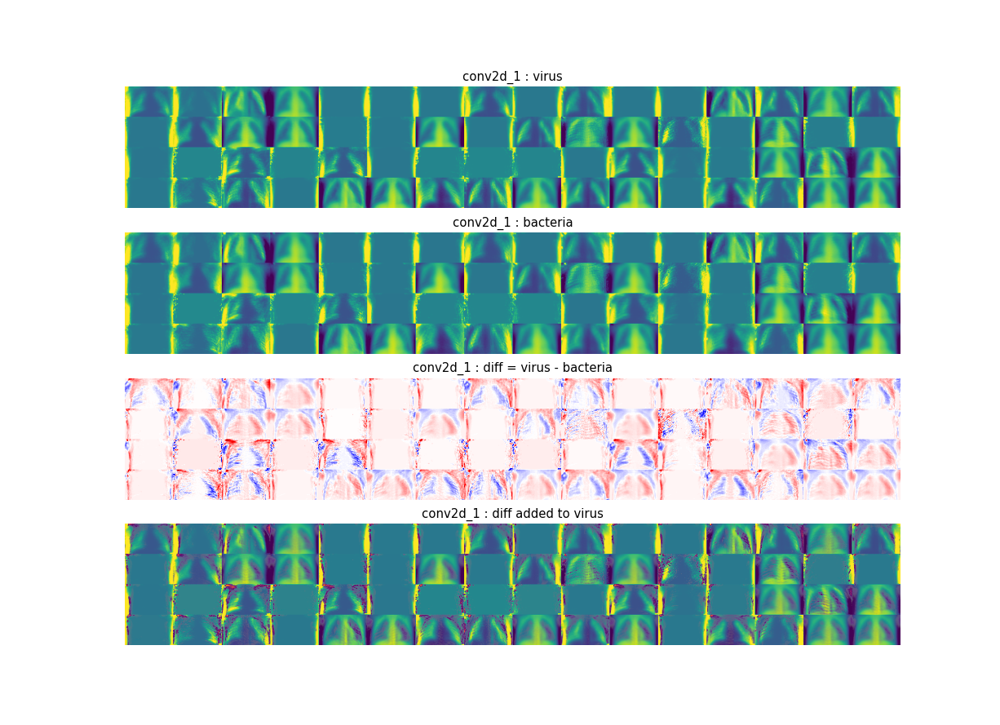

In [42]:
create_visualisations(virus_bac_model, class_one_img_generator, class_two_img_generator, activation_model,
                      num_layers,
                      class_names=class_names,
                      num_cols=16, num_samples=150, digitize=False, num_bins=7)
plt.show()

Studying the diff section, it would appear that the differences are most pronounced with respect to the lungs. It may also be the case that the hearts are slightly larger when bacteria is involved as opposed to a virus. The lack of clarity here is perhaps why this classifier did not perform so well. We continue to digitize the images, and using the different colormap below: 

<IPython.core.display.Javascript object>


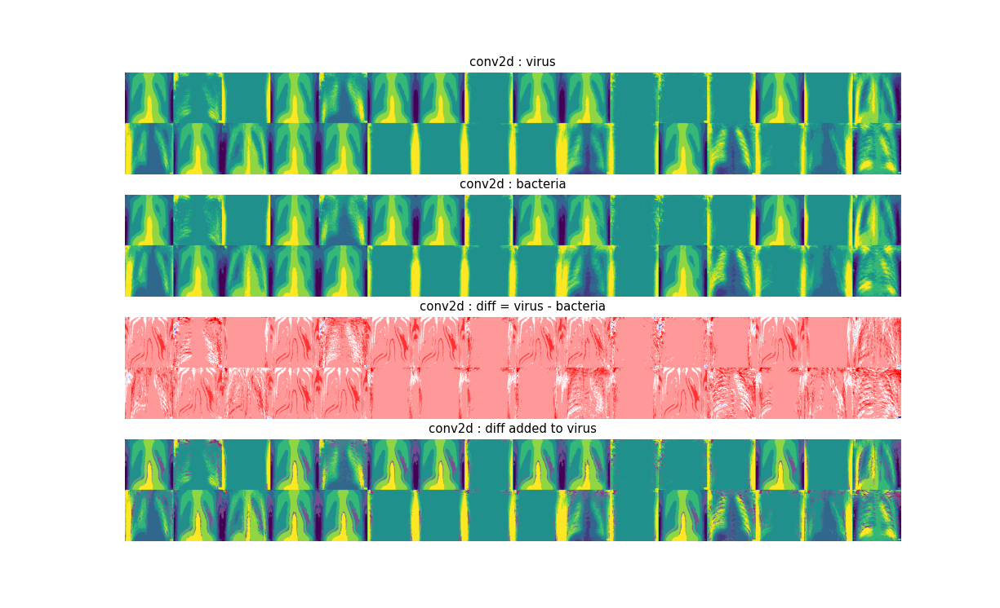

<IPython.core.display.Javascript object>


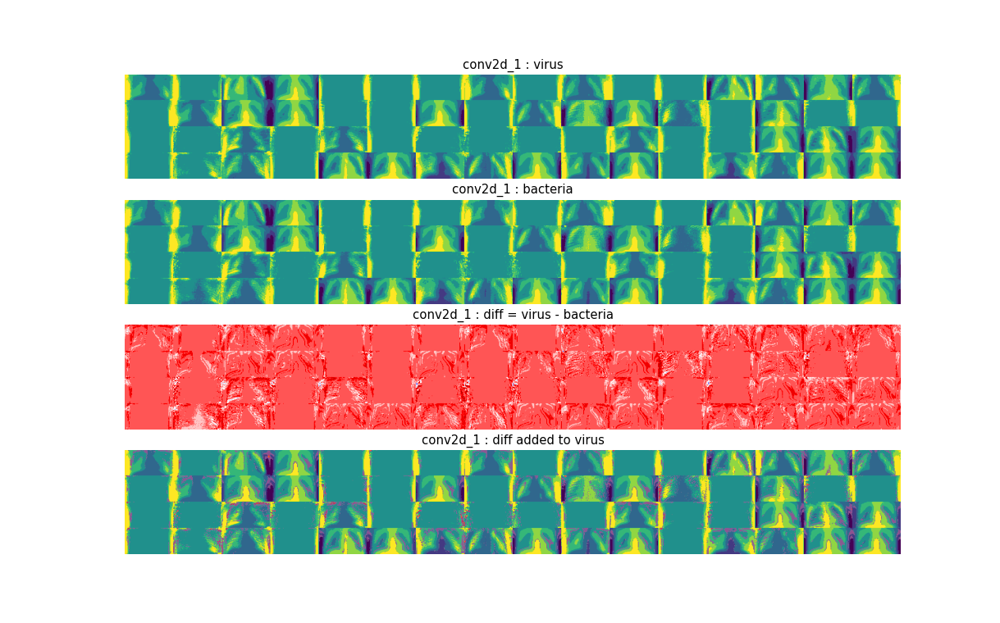

In [31]:
create_visualisations(virus_bac_model, class_one_img_generator, class_two_img_generator, activation_model,
                      num_layers,
                      class_names=class_names,
                      num_cols=16, num_samples=150, digitize=True, num_bins=7)
plt.show()

The digitization has picked up that what appears to be the enzygo-oesophagial line is more prominent with bacteria.

<IPython.core.display.Javascript object>


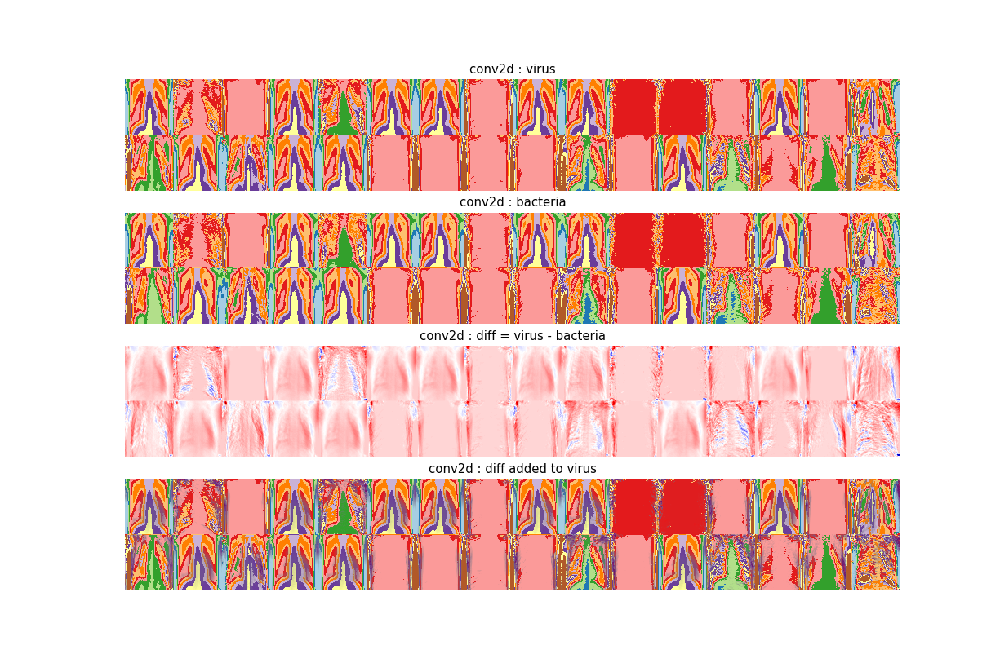

<IPython.core.display.Javascript object>


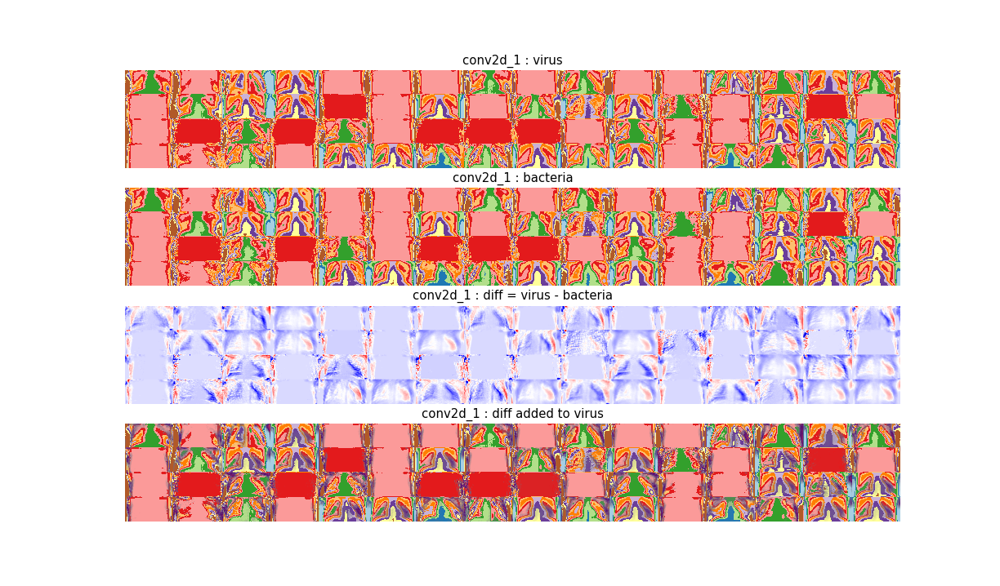

In [32]:
create_visualisations(virus_bac_model, class_one_img_generator, class_two_img_generator, activation_model,
                      num_layers,
                      class_names=class_names,
                      num_cols=16, num_samples=150, digitize=False, num_bins=7, main_cmap='Paired')
plt.show()

We could not learn much form this image, except that again the enzygo-oesophagial line is highlighted differently between the images (with a thicker yellow for bacteria than virus).

## Visualizing the covid/non-covid (virus) model 

Let us now see if the covid/non-covid model is reliable. We earlier saw that it gave good results. However the number of samples used were quite small (around 30).

In [43]:
# step: study of covid/non-covid (virus) model

covid_model = load_model('covid_model_data/covid_small_1.h5')

class_one_img_generator = ImageDataGenerator(rescale=1. / 255).flow_from_directory(
    'Coronahack-Chest-XRay-Dataset/test/covid_noncovid/',
    target_size=(150, 150), batch_size=1, class_mode='binary', color_mode='grayscale', classes=['covid'])

class_two_img_generator = ImageDataGenerator(rescale=1. / 255).flow_from_directory(
    'Coronahack-Chest-XRay-Dataset/test/covid_noncovid/',
    target_size=(150, 150), batch_size=1, class_mode='binary', color_mode='grayscale', classes=['non-covid'])

num_layers = 3
layer_outputs = [layer.output for layer in covid_model.layers[:num_layers]]
activation_model = models.Model(inputs=covid_model.input, outputs=layer_outputs)

class_names = ['covid', 'non-covid (virus)']

Found 15 images belonging to 1 classes.
Found 15 images belonging to 1 classes.


<IPython.core.display.Javascript object>


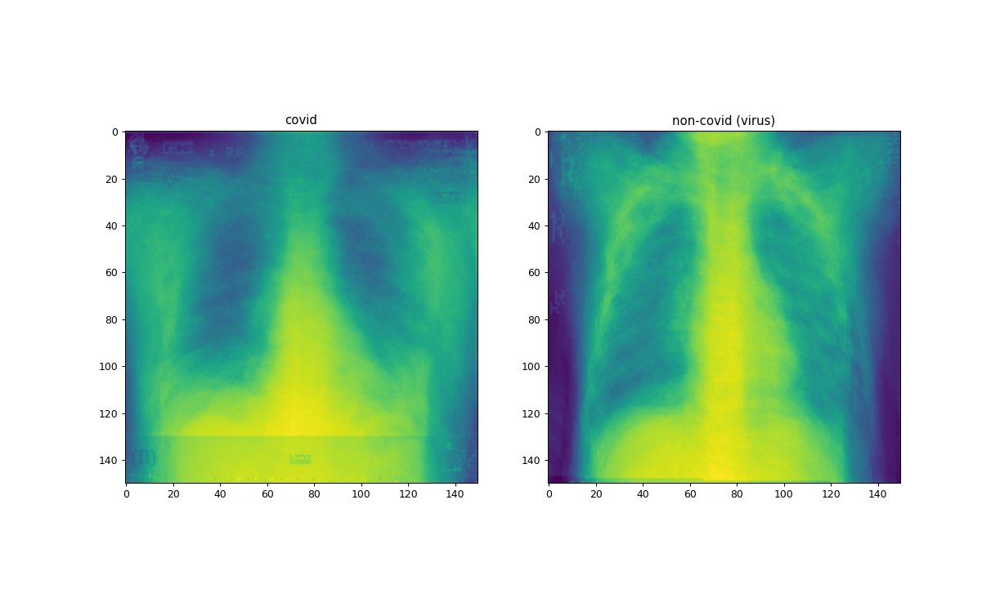

In [44]:
num_samp = 200
img_one = class_one_img_generator.next()[0][0, ..., 0]
img_two = class_two_img_generator.next()[0][0, ..., 0]
for _ in range(1, num_samp):
    img_one += class_one_img_generator.next()[0][0, ..., 0]
    img_two += class_two_img_generator.next()[0][0, ..., 0]

avg_img_one = img_one /num_samp
avg_img_two = img_two /num_samp

fig, axs = plt.subplots(1,2)
axs[0].imshow(avg_img_one)
axs[1].imshow(avg_img_two)

[axs[i].set_title(class_names[i]) for i in range(len(axs))]
plt.show()

The difference in average heart shape appears very strong here.

<IPython.core.display.Javascript object>


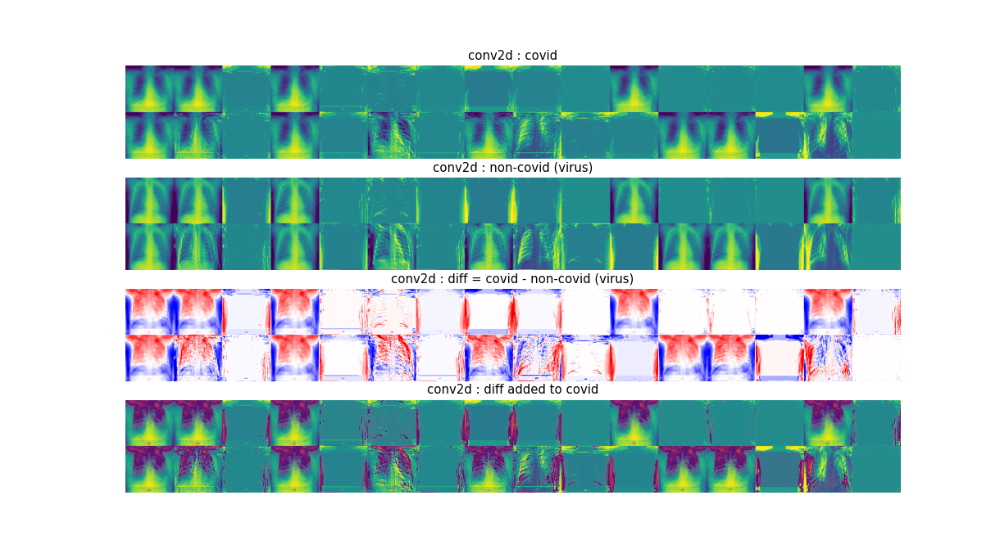

<IPython.core.display.Javascript object>


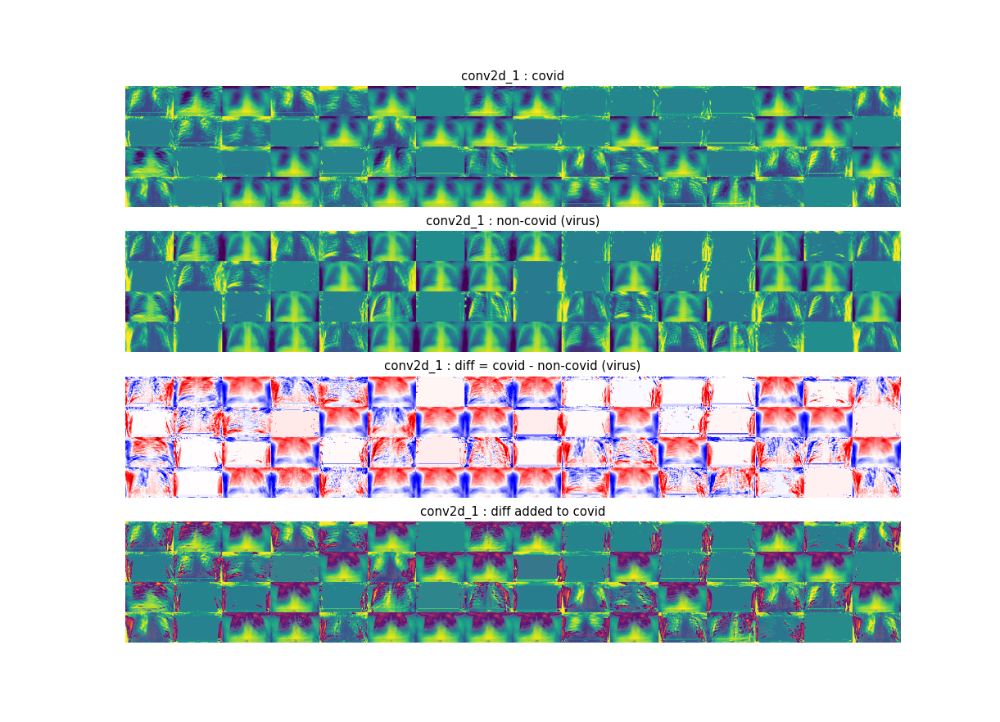

In [45]:
create_visualisations(covid_model, class_one_img_generator, class_two_img_generator, activation_model, num_layers,
                      class_names=class_names,
                      num_cols=16, num_samples=30, digitize=False, num_bins=7)
plt.show()

The distinction here is quite strong. It appears that the hearts of covid patients appear to have sunken, with the mass being centered near its bottom. The diaphragm is also particularly highlighted. Let us see what the next two plots will show:

<IPython.core.display.Javascript object>


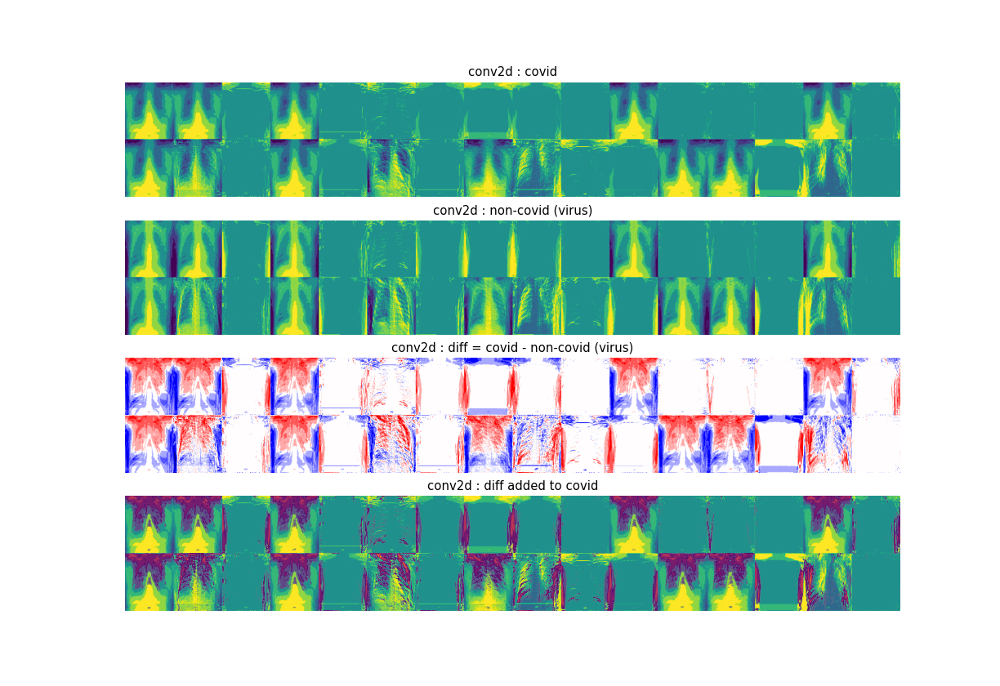

<IPython.core.display.Javascript object>


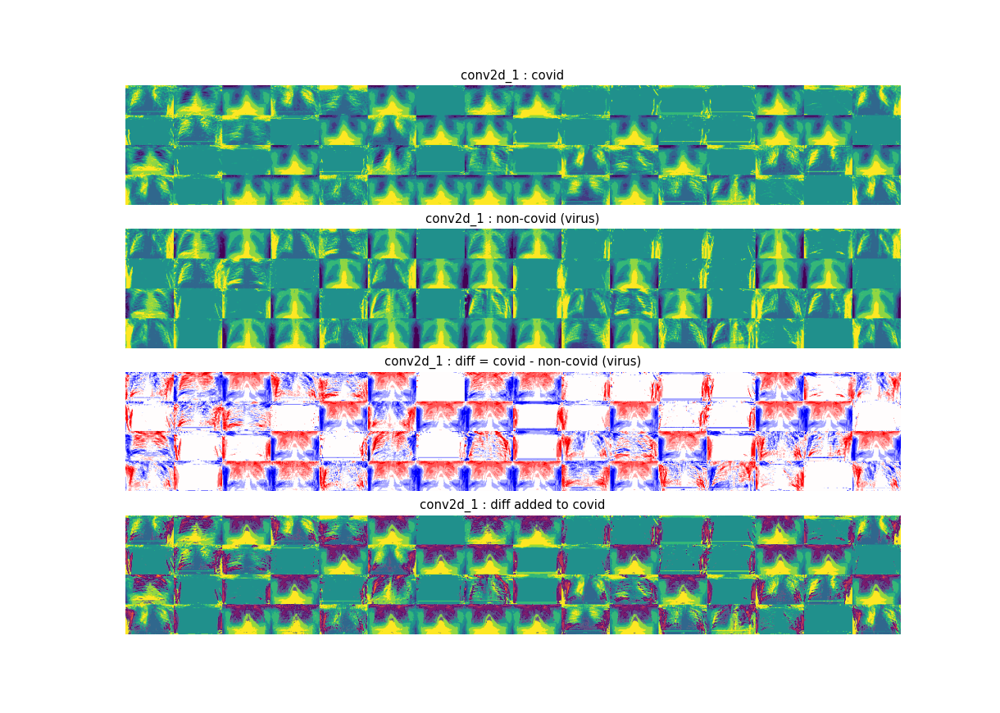

In [36]:
create_visualisations(covid_model, class_one_img_generator, class_two_img_generator, activation_model, num_layers,
                      class_names=class_names,
                      num_cols=16, num_samples=30, digitize=True, num_bins=7)
plt.show()

The image above repeats the discoveries found of the previous image. The heart appears to have a different shape.

<IPython.core.display.Javascript object>


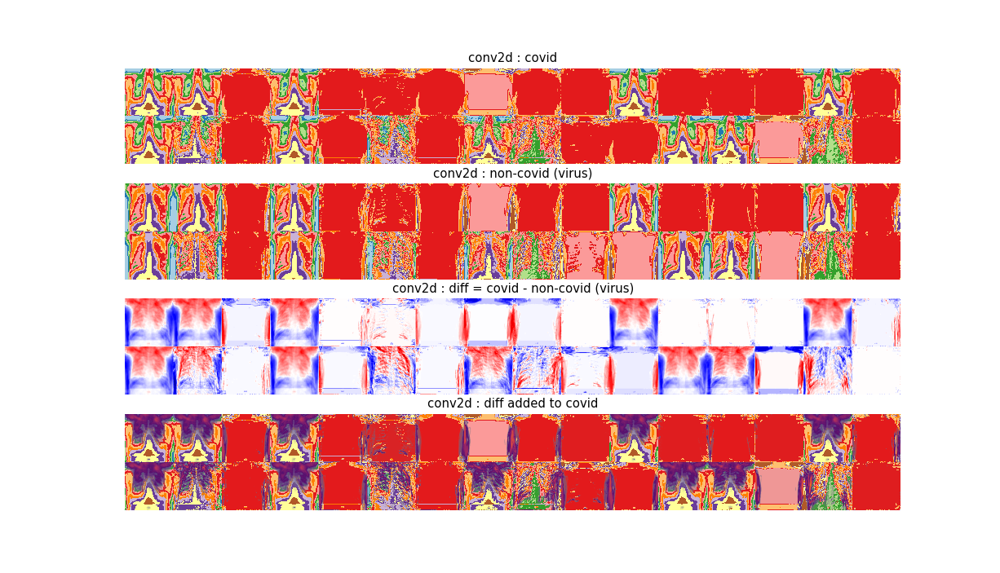

<IPython.core.display.Javascript object>


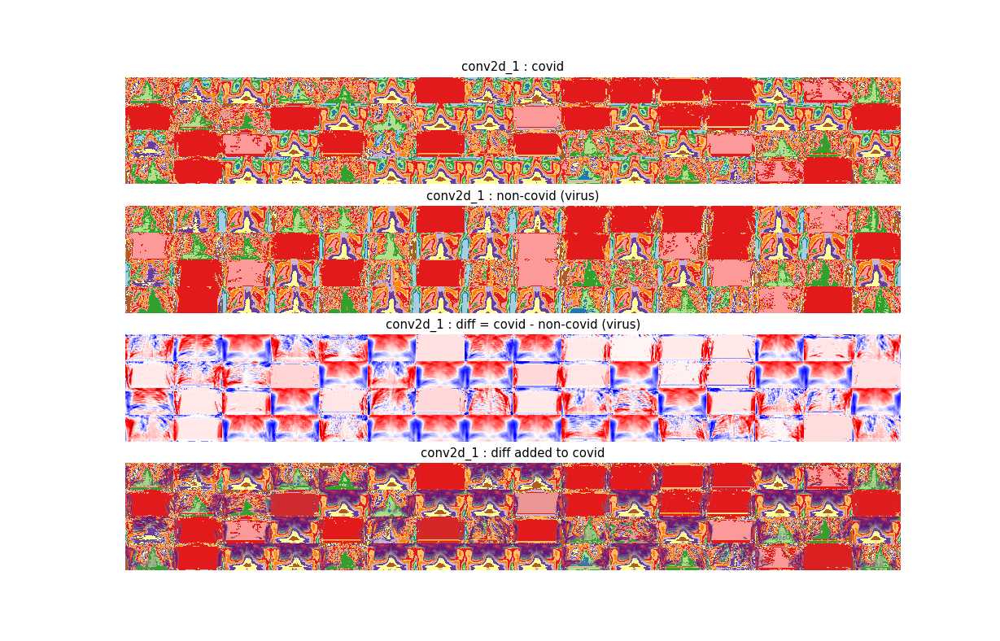

In [38]:
create_visualisations(covid_model, class_one_img_generator, class_two_img_generator, activation_model, num_layers,
                      class_names=class_names,
                      num_cols=16, num_samples=30, digitize=False, num_bins=7, main_cmap='Paired')
plt.show()

This image is quite telling. Again, it shows the heart taking a strongly different shape when affected by covid then when not. The diaphragm also appears to be raised. This shows in both layers of the CNN.

## Conclusions and future work

The images appear to suggest that the hearts of pneumonia patients have changed significantly. There appears to be some work in this area, for example the article (THE SIZE OF THE HEART IN PNEUMONIAA TELEROENTGENOGRAPHIC STUDY, WITH OBSERVATIONS ON THE EFFECT CF DIGITALIS THERAPY) would confirm this, however we have not read it. Amongst patients of CoVid are those who state that they suffer from shortness of breath, which is a symptom of an enlarged (and therefore changed) heart.

Perhaps it can be said that from the average images of the classes (normal/pnemonia) or (covid/non-covid), a doctor or expert may be able to diagnose this scenarios relatively well. Studying the CNN outputs, i.e. after the input has been filtered and colormapped confirms the average differences further. It is a wonder however, that if the images of the dataset would be mostly uncentered, how much more we could study from the CNNs than the averages themselves. For example, would visualisation be useful at all? Perhaps a new dataset will tell us this reality. 